# Image Colorization Using GANs

https://www.kaggle.com/code/ziyadelshazly/image-colorization-using-gans

In [1]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from tensorflow.keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization,LeakyReLU,Flatten
from tensorflow.keras.layers import Conv2DTranspose as Deconv2d
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras import backend as K
import smtplib
from sklearn.utils import shuffle
import tensorflow as tf
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

In [3]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

SIZE = 256

color_img = []
path = os.path.join('..', 'data', 'v_2', 'agri', 's2')
files = os.listdir(path)
files = sorted_alphanumeric(files)
for file in tqdm(files):
    img = cv2.imread(os.path.join(path, file),1)
    # open cv reads images in BGR format so we have to convert it to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    color_img.append(img_to_array(img))


gray_img = []
path = os.path.join('..', 'data', 'v_2', 'agri', 's1')
files = os.listdir(path)
files = sorted_alphanumeric(files)
for file in tqdm(files):
    img = cv2.imread(os.path.join(path, file),1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    gray_img.append(img_to_array(img))


100%|██████████| 4000/4000 [00:27<00:00, 143.35it/s]


In [4]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:2000])).batch(16)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:2000])).batch(16)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[2000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[2000:])).batch(8)

In [5]:
example_color = next(iter(color_dataset))
example_gray = next(iter(gray_dataset))

In [6]:
def plot_images(n):
    for i in range(n):
        plt.figure(figsize = (10,10))
        plt.subplot(121)
        plt.title('color')
        plt.imshow(example_color[i] )

        plt.subplot(122)
        plt.title('gray')
        plt.imshow(example_gray[i])
        plt.show()

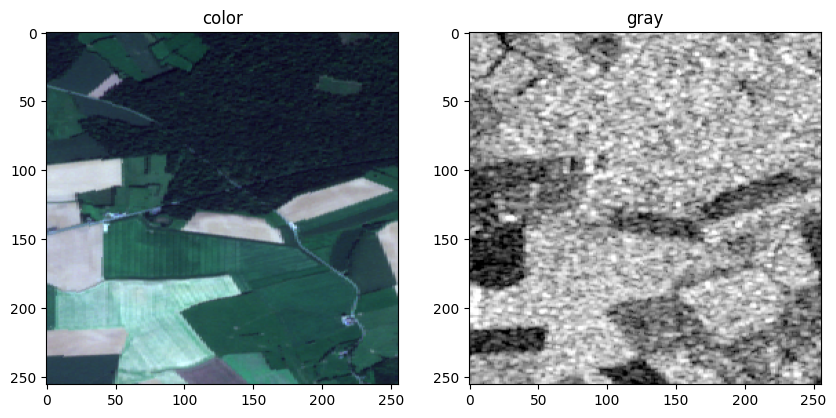

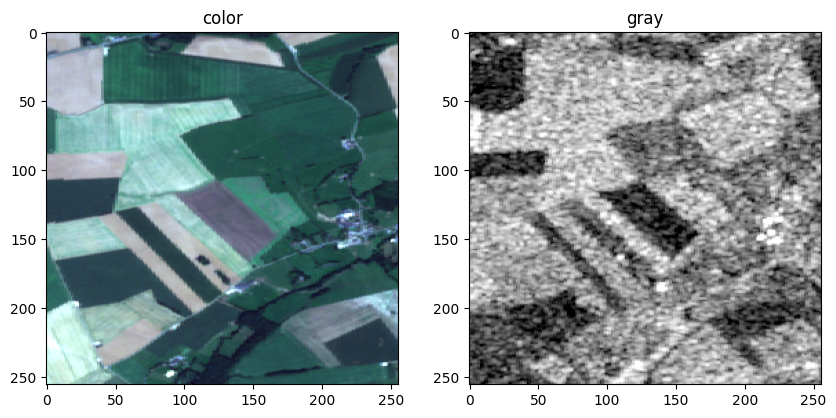

In [7]:
plot_images(2)

## Modeling

In [8]:
def downsample(filters, size, apply_batchnorm=True):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',kernel_initializer='he_normal', use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result

def upsample(filters, size, apply_dropout=False):

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2,padding='same',kernel_initializer='he_normal',use_bias=False))
  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())
  return result

## Generator

In [9]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(3, 4,strides=2,padding='same',kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

## Discriminator

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [11]:
generator = Generator()
generator.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential          │ (None, 128, 128,  │      3,072 │ input_layer[0][0] │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_1        │ (None, 64, 64,    │    131,584 │ sequential[0][0]  │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_2        │ (None, 32, 32,    │    525,312 │ sequential_1[0][… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_3        │ (None, 16, 16,    │  2,099,200 │ sequential_2[0][… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_4        │ (None, 8, 8, 512) │  4,196,352 │ sequential_3[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_5        │ (None, 4, 4, 512) │  4,196,352 │ sequential_4[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_6        │ (None, 2, 2, 512) │  4,196,352 │ sequential_5[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_7        │ (None, 1, 1, 512) │  4,196,352 │ sequential_6[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_8        │ (None, 2, 2, 512) │  4,196,352 │ sequential_7[0][… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 2, 2,      │          0 │ sequential_8[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_6[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_9        │ (None, 4, 4, 512) │  8,390,656 │ concatenate[0][0] │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 4, 4,      │          0 │ sequential_9[0][… │
│ (Concatenate)       │ 1024)             │            │ sequential_5[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_10       │ (None, 8, 8, 512) │  8,390,656 │ concatenate_1[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 8, 8,      │          0 │ sequential_10[0]… │
│ (Concatenate)       │ 1024)             │            │ sequential_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_11       │ (None, 16, 16,    │  8,390,656 │ concatenate_2[0]… │
│ (Sequential)        │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 16, 16,    │          0 │ sequential_11[0]

 Total params: 54,425,859 (207.62 MB)

 Trainable params: 54,414,979 (207.58 MB)

 Non-trainable params: 10,880 (42.50 KB)

In [12]:
discriminator = Discriminator()
discriminator.summary()

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_image         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ target_image        │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 256, 256,  │          0 │ input_image[0][0… │
│ (Concatenate)       │ 6)                │            │ target_image[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_15       │ (None, 128, 128,  │      6,144 │ concatenate_7[0]… │
│ (Sequential)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_16       │ (None, 64, 64,    │    131,584 │ sequential_15[0]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_17       │ (None, 32, 32,    │    525,312 │ sequential_16[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 34, 34,    │          0 │ sequential_17[0]… │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 31, 31,    │  2,097,152 │ zero_padding2d[0… │
│                     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 31, 31,    │      2,048 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_11      │ (None, 31, 31,    │          0 │ batch_normalizat… │
│ (LeakyReLU)         │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 33, 33,    │          0 │ leaky_re_lu_11[0… │
│ (ZeroPadding2D)     │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 30, 30, 1) │      8,193 │ zero_padding2d_1… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 2,770,433 (10.57 MB)

 Trainable params: 2,768,641 (10.56 MB)

 Non-trainable params: 1,792 (7.00 KB)

## Check Loss

In [13]:
genLoss = []
discLoss = []

In [14]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

LAMBDA = 100

def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)
  genLoss.append(total_gen_loss)

  return total_gen_loss, gan_loss, l1_loss

def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss
  discLoss.append(total_disc_loss)

  return total_disc_loss

## Training Method

In [15]:
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

## Fitting Method

In [16]:
import time
def fit(train_ds, epochs,):
  for epoch in range(epochs):
    start = time.time()
    print("Epoch: ", epoch+1)
    # Train
    for n, (input_image, target) in train_ds.enumerate():
      train_step(input_image, target, epoch)
    print()
    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,time.time()-start))

## Generating Code

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7502182..0.8512299].


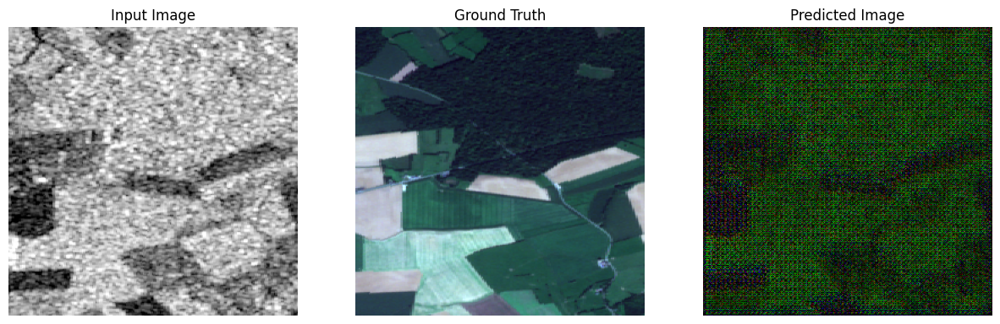

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8336505..0.85363257].


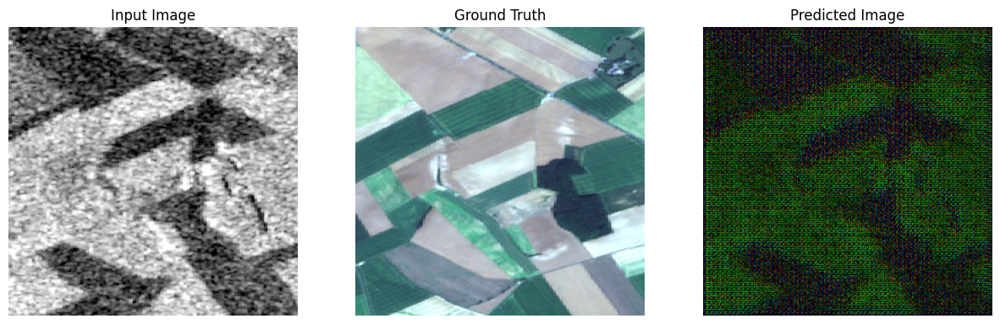

(16, 256, 256, 3)


In [17]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(2):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

In [18]:
hist=fit(tf.data.Dataset.zip((gray_dataset, color_dataset)), epochs=50)

Epoch:  1

Time taken for epoch 1 is 1106.0436749458313 sec

Epoch:  2

Time taken for epoch 2 is 1101.476924419403 sec

Epoch:  3

Time taken for epoch 3 is 1103.3161642551422 sec

Epoch:  4

Time taken for epoch 4 is 1098.0915431976318 sec

Epoch:  5

Time taken for epoch 5 is 1102.271113395691 sec

Epoch:  6

Time taken for epoch 6 is 1097.5314903259277 sec

Epoch:  7

Time taken for epoch 7 is 1097.6050522327423 sec

Epoch:  8

Time taken for epoch 8 is 1093.828610420227 sec

Epoch:  9

Time taken for epoch 9 is 1094.4176259040833 sec

Epoch:  10

Time taken for epoch 10 is 1094.6341171264648 sec

Epoch:  11

Time taken for epoch 11 is 1092.6123983860016 sec

Epoch:  12

Time taken for epoch 12 is 1088.9884021282196 sec

Epoch:  13

Time taken for epoch 13 is 1090.0648341178894 sec

Epoch:  14

Time taken for epoch 14 is 1095.4235785007477 sec

Epoch:  15

Time taken for epoch 15 is 1094.0877623558044 sec

Epoch:  16

Time taken for epoch 16 is 1094.6331899166107 sec

Epoch:  17

T

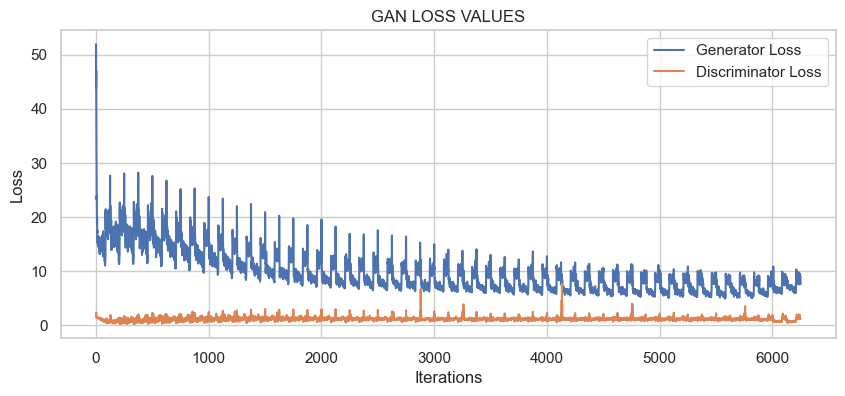

In [19]:
import seaborn as sns
sns.set(style='whitegrid')
plt.figure(figsize=(10,4))
plt.plot(genLoss, label="Generator Loss")
plt.plot(discLoss, label="Discriminator Loss")
plt.title("GAN LOSS VALUES")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17803179..0.95358306].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


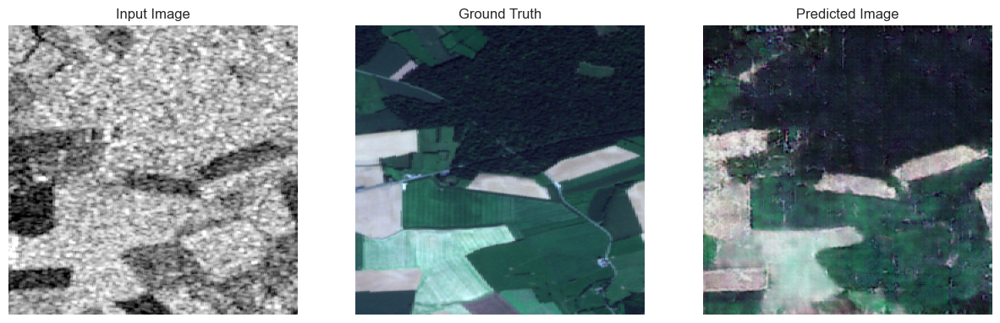

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04343545..0.9924123].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


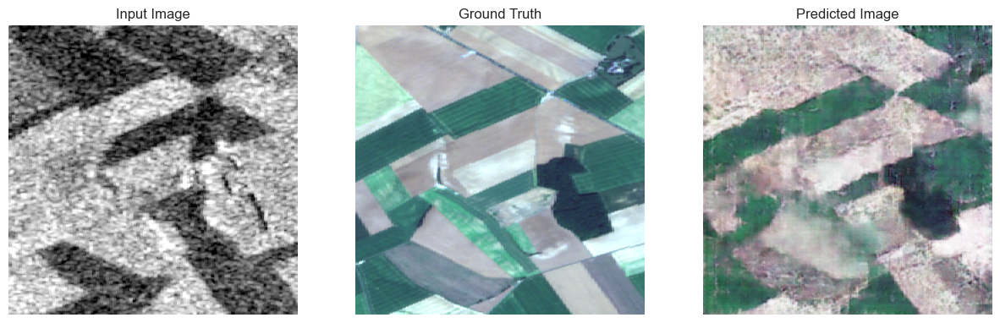

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16731258..0.99221706].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


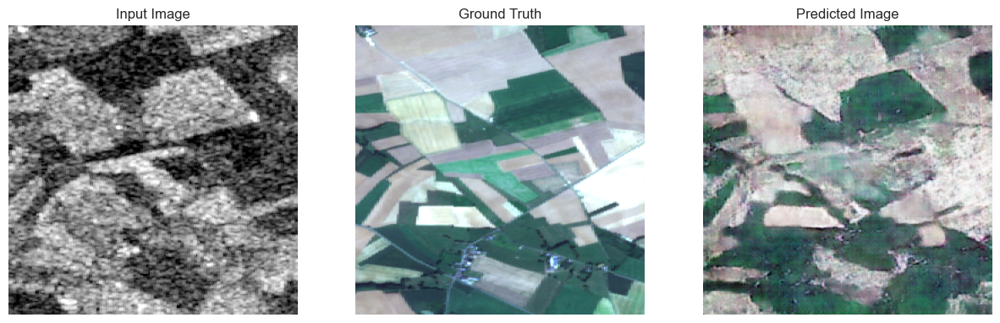

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.092908494..0.99486417].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


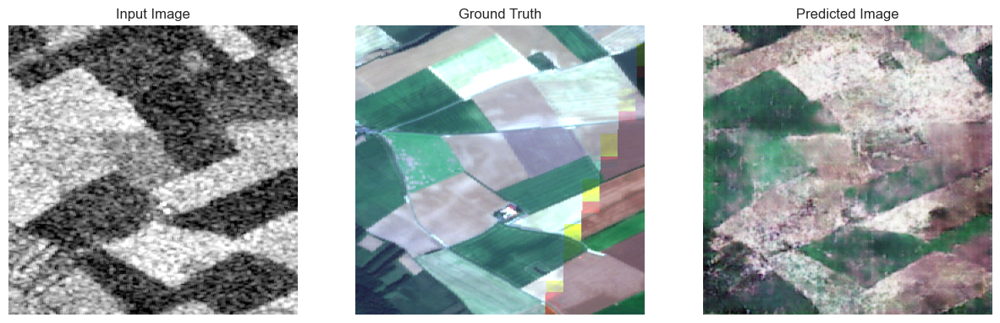

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17798533..0.9772722].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


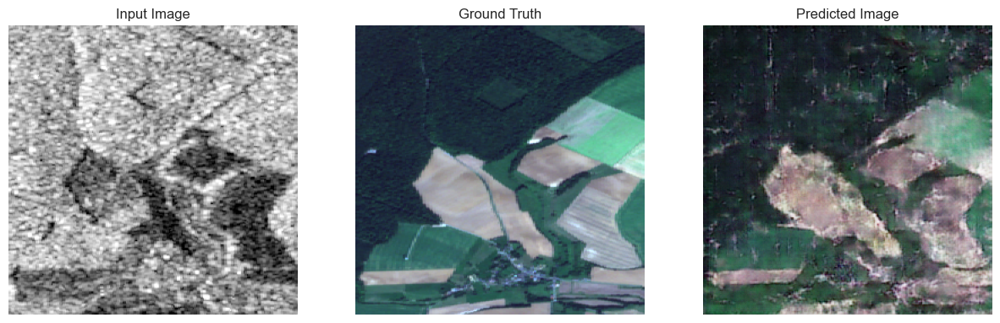

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1949495..0.9833409].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


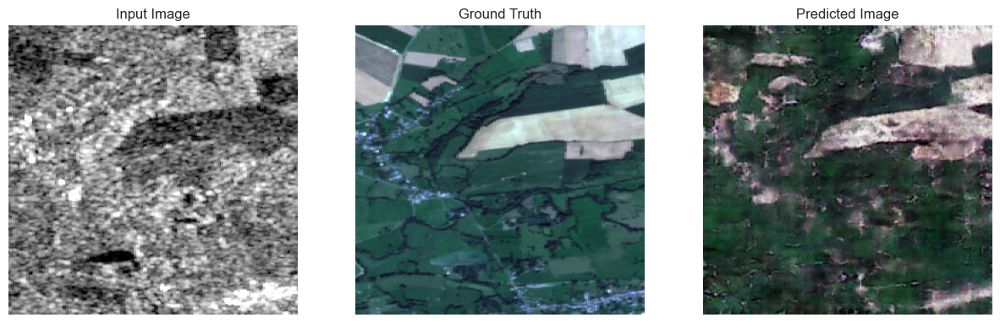

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.44430292..0.9997193].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


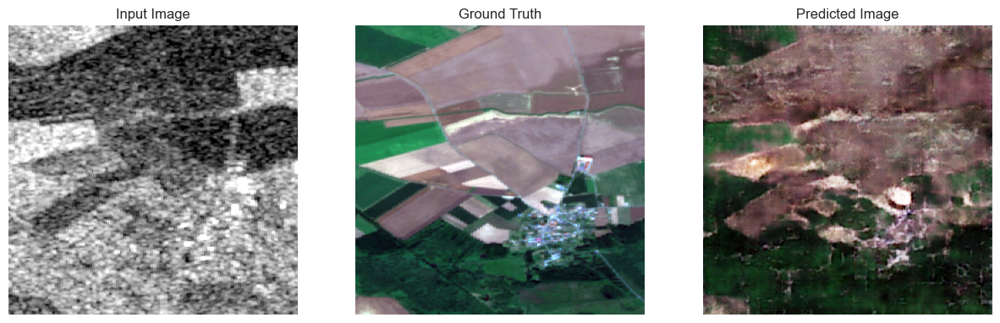

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14863585..0.9998407].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


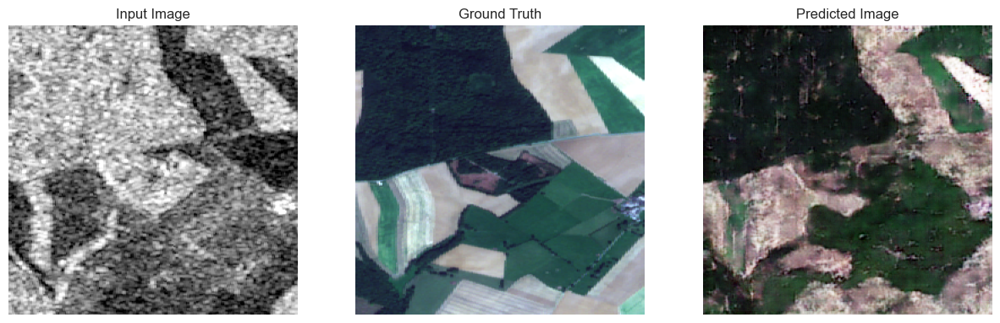

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16271052..0.9451902].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


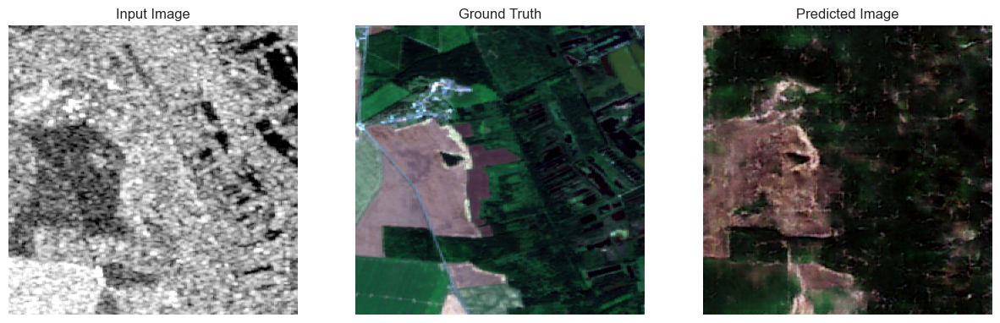

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30342597..0.99750334].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


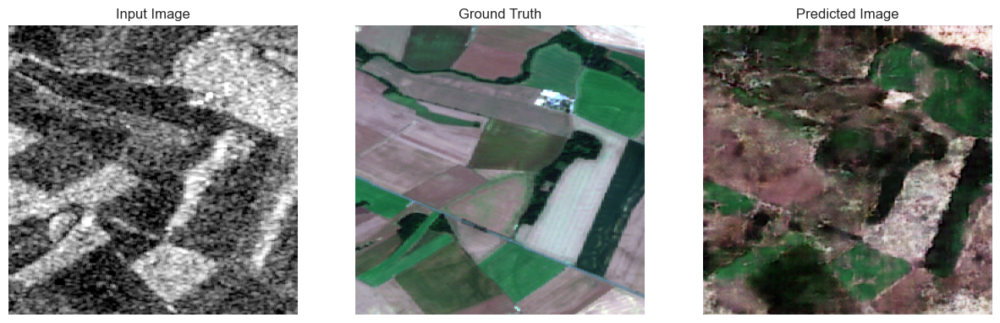

(16, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16221821..0.9937079].


(256, 256, 3)
(256, 256, 3)
(256, 256, 3)


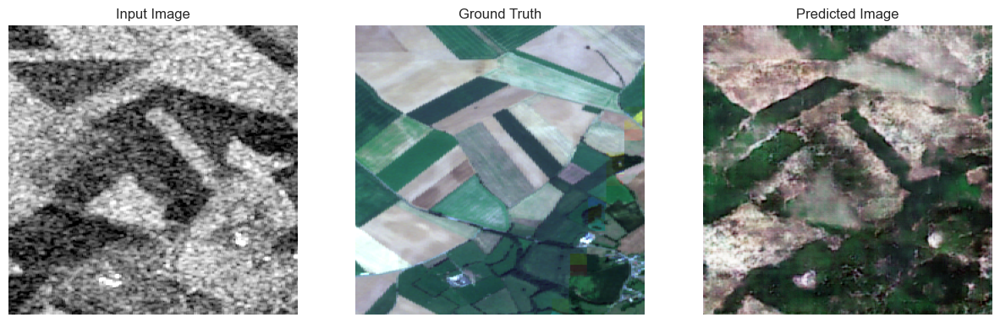

(16, 256, 256, 3)


In [20]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15,15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    print(test_input[0].shape)
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i])
    plt.axis('off')
  plt.show()

for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(11):
  generate_images(generator, example_input, example_target)
  print(example_input.shape)

## Evaluation

### 1. Mean Squared Error (MSE)

**Definition:** MSE calculates the average squared difference between the original (ground truth) and the predicted (colorized) image pixels.

**Interpretation:** Lower MSE indicates better image quality.

**Limitations:** It does not capture perceptual differences well (e.g., human vision might perceive two images as similar despite a high MSE).

In [21]:
def mse(image_true, image_pred):
    return np.mean((image_true - image_pred) ** 2)
for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(1):
    print(mse(example_input, example_target))

0.16806374


### 2. Peak Signal-to-Noise Ratio (PSNR)

**Definition:** PSNR measures the ratio of the maximum possible pixel value to the error between the two images.

**Interpretation:** Higher PSNR indicates better image quality.

**Limitations:** Like MSE, PSNR is a pixel-wise metric and does not always correlate with perceptual quality.

In [22]:
def psnr(image_true, image_pred):
    return cv2.PSNR(image_true, image_pred)
for example_input, example_target in tf.data.Dataset.zip((gray_dataset,color_dataset)).take(1):
    print(psnr(example_input.numpy(), example_target.numpy()))

55.87606506440649


### 3. Structural Similarity Index (SSIM)

**Definition:** SSIM evaluates the structural similarity between images based on luminance, contrast, and structure.

**Interpretation:** SSIM ranges from -1 to 1, where 1 indicates perfect similarity.

**Advantages:** SSIM aligns more with human perception than MSE and PSNR.

In [23]:
from skimage.metrics import structural_similarity as ssim
def ssim_score(image_true, image_pred):
    return ssim(image_true, image_pred, win_size=3, channel_axis=-1, data_range=1.0)
ssim_score(example_input.numpy(), example_target.numpy())

np.float32(-0.22880791)

## Saving the model

In [ ]:
generator.save('../models/colorization-GAN-with-autoencoders-agri.keras')

In [2]:
import tensorflow as tf
model = tf.keras.models.load_model('../models/colorization-GAN-with-autoencoders-agri.keras')

In [3]:
import numpy as np
import h5py
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from tensorflow.keras.layers import Input,Dense,Reshape,Conv2D,Dropout,multiply,Dot,Concatenate,subtract,ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization,LeakyReLU,Flatten
from tensorflow.keras.layers import Conv2DTranspose as Deconv2d
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras import backend as K
import smtplib
from sklearn.utils import shuffle
import tensorflow as tf
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm
import re
from keras.preprocessing.image import img_to_array

In [4]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

SIZE = 256

color_img = []
path = os.path.join('..', 'data', 'v_2', 'agri', 's2')
files = os.listdir(path)
files = sorted_alphanumeric(files)
for file in tqdm(files):
    img = cv2.imread(os.path.join(path, file),1)
    # open cv reads images in BGR format so we have to convert it to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    color_img.append(img_to_array(img))


gray_img = []
path = os.path.join('..', 'data', 'v_2', 'agri', 's1')
files = os.listdir(path)
files = sorted_alphanumeric(files)
for file in tqdm(files):
    img = cv2.imread(os.path.join(path, file),1)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #resizing image
    img = cv2.resize(img, (SIZE, SIZE))
    img = img.astype('float32') / 255.0
    gray_img.append(img_to_array(img))


  0%|          | 0/4000 [00:00<?, ?it/s]

100%|██████████| 4000/4000 [00:07<00:00, 544.54it/s]


In [5]:
color_dataset=tf.data.Dataset.from_tensor_slices(np.array(color_img[:2000])).batch(16)
gray_dataset=tf.data.Dataset.from_tensor_slices(np.array(gray_img[:2000])).batch(16)

color_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(color_img[2000:])).batch(8)
gray_dataset_t=tf.data.Dataset.from_tensor_slices(np.array(gray_img[2000:])).batch(8)

In [6]:
preds = model.predict(gray_dataset_t)

250/250 ━━━━━━━━━━━━━━━━━━━━ 93s 364ms/step


In [7]:
type(preds)

numpy.ndarray

In [8]:
type(color_dataset_t)

tensorflow.python.data.ops.batch_op._BatchDataset

## PSNR

In [9]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 1.0  # If images are normalized [0,1]
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

# Compute PSNR for all images
psnr_values = [psnr(gt, pred) for gt, pred in zip(color_dataset_t, preds)]
mean_psnr = np.mean(psnr_values)

print(f"Mean PSNR: {mean_psnr:.2f} dB")

Mean PSNR: 11.71 dB


In [13]:
from skimage.metrics import structural_similarity as ssim

def compute_ssim(img1, img2):
    return ssim(img1, img2, win_size=3, multichannel=True, data_range=1.0)  # Assuming images are in [0,1] range

# Compute SSIM for all images
ground_truth_images = np.concatenate([batch.numpy() for batch in color_dataset_t])
ground_truth_images = ground_truth_images / 255.0
preds = preds / 255.0
ssim_values = [compute_ssim(gt, pred) for gt, pred in zip(ground_truth_images, preds)]
mean_ssim = np.mean(ssim_values)

print(f"Mean SSIM: {mean_ssim:.4f}")

Mean SSIM: 0.9739


In [14]:
import numpy as np

def compute_enl(image):
    """
    Compute Equivalent Number of Looks (ENL) for a given homogeneous region.
    
    :param image: Input grayscale or single-channel image as a NumPy array
    :return: ENL value
    """
    mu = np.mean(image)  # Mean intensity
    sigma_sq = np.var(image)  # Variance (σ^2)
    
    if sigma_sq == 0:
        return float('inf')  # Avoid division by zero
    
    enl = (mu ** 2) / sigma_sq
    return enl

# Example usage on a single image (Convert to grayscale if needed)
sample_image = preds[0] / 255.0
enl_value = compute_enl(sample_image)

print(f"Equivalent Number of Looks (ENL): {enl_value:.2f}")

Equivalent Number of Looks (ENL): 5.81


In [15]:
import numpy as np

def compute_mse(image1, image2):
    """
    Compute Mean Squared Error (MSE) between two images.
    
    :param image1: Ground truth image (NumPy array)
    :param image2: Predicted/generated image (NumPy array)
    :return: MSE value
    """
    return np.mean((image1 - image2) ** 2)

# Compute MSE for the entire dataset
mse_values = [compute_mse(gt, pred) for gt, pred in zip(ground_truth_images, preds)]

# Calculate mean MSE across all images
mean_mse = np.mean(mse_values)

print(f"Mean MSE: {mean_mse:.4f}")

Mean MSE: 0.0000


In [17]:
import lpips
import torch
import numpy as np

lpips_model = lpips.LPIPS(net='alex')

def compute_lpips(image1, image2):
    """
    Compute LPIPS score between two images.
    
    :param image1: Ground truth image (NumPy array)
    :param image2: Predicted/generated image (NumPy array)
    :return: LPIPS value
    """
    # Convert images to Torch tensors and normalize to [-1, 1]
    image1_t = torch.tensor(image1).permute(2, 0, 1).unsqueeze(0) * 2 - 1
    image2_t = torch.tensor(image2).permute(2, 0, 1).unsqueeze(0) * 2 - 1

    # Compute LPIPS distance
    lpips_value = lpips_model(image1_t, image2_t)
    return lpips_value.item()

# Compute LPIPS for the entire dataset
lpips_values = [compute_lpips(gt, pred) for gt, pred in zip(ground_truth_images, preds)]

# Calculate mean LPIPS across all images
mean_lpips = np.mean(lpips_values)

print(f"Mean LPIPS: {mean_lpips:.4f}")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\Naman\Desktop\Repos\sar\model\env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Naman\Desktop\Repos\sar\model\env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: c:\Users\Naman\Desktop\Repos\sar\model\env\Lib\site-packages\lpips\weights\v0.1\alex.pth
Mean LPIPS: 0.0003
